In [1]:
%pwd
%cd /home/kwy00/ysy2/
%ls -l

/home/kwy00/ysy2
합계 463352
-rw-rw-r-- 1 kwy00 kwy00 72055804 Nov 27 21:58 copy-of-crack-segmentation-cnu.zip
drwxrwxr-x 6 kwy00 kwy00     4096 Nov 27 21:54 crackdata/
drwxrwxr-x 8 kwy00 kwy00     4096 Dec  6 13:57 guided-filter/
drwxrwxr-x 5 kwy00 kwy00     4096 Nov 27 22:00 kaggle_dataset/
-rw-rw-r-- 1 kwy00 kwy00 51674219 Dec  6 15:45 results.csv
-rw-rw-r-- 1 kwy00 kwy00 38966598 Dec  6 15:01 segment_model.pth_0
-rw-rw-r-- 1 kwy00 kwy00 38966598 Dec  6 15:08 segment_model.pth_10
-rw-rw-r-- 1 kwy00 kwy00 38966598 Dec  6 15:16 segment_model.pth_20
-rw-rw-r-- 1 kwy00 kwy00 38966598 Dec  6 15:23 segment_model.pth_30
-rw-rw-r-- 1 kwy00 kwy00 38966598 Dec  6 15:30 segment_model.pth_40
-rw-rw-r-- 1 kwy00 kwy00 38966598 Dec  6 15:38 segment_model.pth_50
-rw-rw-r-- 1 kwy00 kwy00 38966598 Dec  3 21:31 segment_model.pth_60
-rw-rw-r-- 1 kwy00 kwy00 38966598 Dec  3 21:34 segment_model.pth_70
-rw-rw-r-- 1 kwy00 kwy00 38966598 Dec  3 21:37 segment_model.pth_80


In [ ]:
!pip install torchmetrics

In [ ]:
!git clone https://github.com/CHDyshli/HrSegNet4CrackSegmentation.git

In [ ]:
!pip install paddlepaddle-gpu

In [ ]:
!pip install paddleseg

In [2]:
import warnings
warnings.filterwarnings('ignore')

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tqdm.autonotebook import tqdm

from sklearn.model_selection import train_test_split

from glob import glob
import torch
import torch.nn as nn
from torchvision import transforms as T
import albumentations as A
from torch.utils.data import Dataset, DataLoader, ConcatDataset
import torchvision
import random, gc

from albumentations.pytorch.transforms import ToTensorV2
import torch.nn.functional as F


seed=42

In [3]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"current device : {device}")

current device : cuda


In [30]:
CFG = {
    'EPOCHS' : 45,
    'LEARNING_RATE' : 1e-4,
    'NUM_CLASSES' : 1,
    'BATCH_SIZE' : 16,
    'SEED' : 42,
    'IMAGE_SIZE' : 256,
    'PATH' : os.path.join('/home/kwy00/ysy2/', 'segment_model.pth')
}

In [6]:
def init_seed(seed):
  torch.manual_seed(seed)
  torch.cuda.manual_seed(seed)

  np.random.seed(seed)

  random.seed(seed)

  gc.collect()
  torch.cuda.empty_cache()

init_seed(CFG['SEED'])

In [7]:
base_path = '/home/kwy00/ysy2/kaggle_dataset/'
path_to_images = os.path.join(base_path, 'train_img')
path_to_masks = os.path.join(base_path, 'train_lab')

image_paths = sorted(glob(path_to_images + '/*.jpg'))
mask_paths = sorted(glob(path_to_masks + '/*.png'))

In [8]:
test_files = pd.read_csv(os.path.join('/home/kwy00/ysy2/kaggle_dataset/', 'test_files.csv'))
test_files

,ID,label
0,11194.jpg,0
1,11270-2.jpg,0
2,11296-6.jpg,0
3,11231-9.jpg,0
4,11249-6.jpg,0
...,...,...
232,IMG_6542-7.jpg,0
233,11295.jpg,0
234,11169-2.jpg,0
235,11247-8.jpg,0


In [9]:
print("img file counts : ", len(image_paths))
print("mask file counts : ", len(mask_paths))

img file counts :  300
mask file counts :  300


In [10]:
print("test file counts : ", len(test_files))

test file counts :  237


In [11]:
train_df = pd.DataFrame({'ID' : image_paths, 'label' : mask_paths})
train_df.head(5)

,ID,label
0,/home/kwy00/ysy2/kaggle_dataset/train_img/1111...,/home/kwy00/ysy2/kaggle_dataset/train_lab/1111...
1,/home/kwy00/ysy2/kaggle_dataset/train_img/1111...,/home/kwy00/ysy2/kaggle_dataset/train_lab/1111...
2,/home/kwy00/ysy2/kaggle_dataset/train_img/1111...,/home/kwy00/ysy2/kaggle_dataset/train_lab/1111...
3,/home/kwy00/ysy2/kaggle_dataset/train_img/1111...,/home/kwy00/ysy2/kaggle_dataset/train_lab/1111...
4,/home/kwy00/ysy2/kaggle_dataset/train_img/1111...,/home/kwy00/ysy2/kaggle_dataset/train_lab/1111...


In [12]:
test_files['ID'] = base_path + '/test_img/' + test_files['ID']
test_files.head(5)

,ID,label
0,/home/kwy00/ysy2/kaggle_dataset//test_img/1119...,0
1,/home/kwy00/ysy2/kaggle_dataset//test_img/1127...,0
2,/home/kwy00/ysy2/kaggle_dataset//test_img/1129...,0
3,/home/kwy00/ysy2/kaggle_dataset//test_img/1123...,0
4,/home/kwy00/ysy2/kaggle_dataset//test_img/1124...,0


In [13]:
train, valid = train_test_split(train_df, test_size=0.1, shuffle=True, random_state=seed)

print(f"splited train size : {len(train)}, \
 validation size: {len(valid)}, test size : {len(test_files)}")


splited train size : 270,  validation size: 30, test size : 237


In [14]:
train_transforms = A.Compose([
    A.Resize(CFG['IMAGE_SIZE'], CFG['IMAGE_SIZE']),
    ToTensorV2(),
], is_check_shapes=False)

test_transforms = A.Compose([
    A.Resize(CFG['IMAGE_SIZE'], CFG['IMAGE_SIZE']),
    ToTensorV2()
], is_check_shapes=False)

sharpening_transforms = A.Compose([
    A.Resize(CFG['IMAGE_SIZE'], CFG['IMAGE_SIZE']),
    A.augmentations.transforms.Sharpen(alpha=(0.2, 0.5), lightness=(0.5, 1.0), p=1.0),
    ToTensorV2()
], is_check_shapes=False)

colorjitter_transforms = A.Compose([
    A.Resize(CFG['IMAGE_SIZE'], CFG['IMAGE_SIZE']),
    A.augmentations.transforms.ColorJitter(brightness=(0.5, 1.5), contrast=(0.5, 1.5),
                                           saturation=(0.5, 1.5), p=1.0),
    ToTensorV2(),
], is_check_shapes=False)

noise_transforms = A.Compose([
    A.Resize(CFG['IMAGE_SIZE'], CFG['IMAGE_SIZE']),
    A.augmentations.transforms.GaussNoise(var_limit=(10.0, 50.0), mean=0, per_channel=True,
                                          p=1.0),
    ToTensorV2()
], is_check_shapes=False)

superpixel_transforms = A.Compose([
    A.Resize(CFG['IMAGE_SIZE'], CFG['IMAGE_SIZE']),
    A.augmentations.transforms.Superpixels(p=1.0),
    ToTensorV2()
], is_check_shapes=False)


In [18]:
rotate_transforms = A.Compose([
    A.augmentations.geometric.rotate.Rotate(limit=(0, 45), p=1.0),
    A.augmentations.crops.transforms.CenterCrop(256, 256, p=1.0),    
    # A.Resize(CFG['IMAGE_SIZE'], CFG['IMAGE_SIZE']),    
    ToTensorV2()
], is_check_shapes=False)


rotate_transforms1 = A.Compose([
    A.augmentations.geometric.rotate.Rotate(limit=(45, 90), p=1.0),
    A.augmentations.crops.transforms.CenterCrop(256, 256, p=1.0),    
    # A.Resize(CFG['IMAGE_SIZE'], CFG['IMAGE_SIZE']),    
    ToTensorV2()
], is_check_shapes=False)


rotate_transforms2 = A.Compose([
    A.augmentations.geometric.rotate.Rotate(limit=(90, 135), p=1.0),
    A.augmentations.crops.transforms.CenterCrop(256, 256, p=1.0),    
    # A.Resize(CFG['IMAGE_SIZE'], CFG['IMAGE_SIZE']),    
    ToTensorV2()
], is_check_shapes=False)

rotate_transforms3 = A.Compose([
    A.augmentations.geometric.rotate.Rotate(limit=(135, 180), p=1.0),
    A.augmentations.crops.transforms.CenterCrop(256, 256, p=1.0),    
    A.Resize(CFG['IMAGE_SIZE'], CFG['IMAGE_SIZE']),    
    ToTensorV2()
], is_check_shapes=False)

rotate_transforms4 = A.Compose([
    A.augmentations.geometric.rotate.Rotate(limit=(180, 225), p=1.0),
    A.augmentations.crops.transforms.CenterCrop(256, 256, p=1.0),    
    A.Resize(CFG['IMAGE_SIZE'], CFG['IMAGE_SIZE']),    
    ToTensorV2()
], is_check_shapes=False)

rotate_transforms5 = A.Compose([
    A.augmentations.geometric.rotate.Rotate(limit=(225, 270), p=1.0),
    A.augmentations.crops.transforms.CenterCrop(256, 256, p=1.0),    
    A.Resize(CFG['IMAGE_SIZE'], CFG['IMAGE_SIZE']),    
    ToTensorV2()
], is_check_shapes=False)

rotate_transforms6 = A.Compose([
    A.augmentations.geometric.rotate.Rotate(limit=(315, 360), p=1.0),
    A.augmentations.crops.transforms.CenterCrop(256, 256, p=1.0),    
    A.Resize(CFG['IMAGE_SIZE'], CFG['IMAGE_SIZE']),    
    ToTensorV2()
], is_check_shapes=False)


rotate_transforms7 = A.Compose([
    A.augmentations.geometric.rotate.Rotate(limit=(0, 45), p=1.0),
    A.augmentations.crops.transforms.CenterCrop(256, 256, p=1.0),    
    A.augmentations.geometric.transforms.HorizontalFlip(p=1.0),
    A.Resize(CFG['IMAGE_SIZE'], CFG['IMAGE_SIZE']),    
    ToTensorV2()
], is_check_shapes=False)


rotate_transforms8 = A.Compose([
    A.augmentations.geometric.rotate.Rotate(limit=(45, 90), p=1.0),
    A.augmentations.crops.transforms.CenterCrop(256, 256, p=1.0),    
    A.augmentations.geometric.transforms.HorizontalFlip(p=1.0),
    A.Resize(CFG['IMAGE_SIZE'], CFG['IMAGE_SIZE']),    
    ToTensorV2()
], is_check_shapes=False)


rotate_transforms9 = A.Compose([
    A.augmentations.geometric.rotate.Rotate(limit=(90, 135), p=1.0),
    A.augmentations.crops.transforms.CenterCrop(256, 256, p=1.0),    
    A.augmentations.geometric.transforms.HorizontalFlip(p=1.0),
    A.Resize(CFG['IMAGE_SIZE'], CFG['IMAGE_SIZE']),    
    ToTensorV2()
], is_check_shapes=False)

rotate_transforms10 = A.Compose([
    A.augmentations.geometric.rotate.Rotate(limit=(135, 180), p=1.0),
    A.augmentations.crops.transforms.CenterCrop(256, 256, p=1.0),    
    A.augmentations.geometric.transforms.HorizontalFlip(p=1.0),
    A.Resize(CFG['IMAGE_SIZE'], CFG['IMAGE_SIZE']),    
    ToTensorV2()
], is_check_shapes=False)

rotate_transforms11 = A.Compose([
    A.augmentations.geometric.rotate.Rotate(limit=(180, 225), p=1.0),
    A.augmentations.crops.transforms.CenterCrop(256, 256, p=1.0),    
    A.augmentations.geometric.transforms.HorizontalFlip(p=1.0),
    A.Resize(CFG['IMAGE_SIZE'], CFG['IMAGE_SIZE']),    
    ToTensorV2()
], is_check_shapes=False)

rotate_transforms12 = A.Compose([
    A.augmentations.geometric.rotate.Rotate(limit=(225, 270), p=1.0),
    A.augmentations.crops.transforms.CenterCrop(256, 256, p=1.0),    
    A.augmentations.geometric.transforms.HorizontalFlip(p=1.0),
    A.Resize(CFG['IMAGE_SIZE'], CFG['IMAGE_SIZE']),    
    ToTensorV2()
], is_check_shapes=False)

rotate_transforms13 = A.Compose([
    A.augmentations.geometric.rotate.Rotate(limit=(315, 360), p=1.0),
    A.augmentations.crops.transforms.CenterCrop(256, 256, p=1.0),    
    A.augmentations.geometric.transforms.HorizontalFlip(p=1.0),
    A.Resize(CFG['IMAGE_SIZE'], CFG['IMAGE_SIZE']),    
    ToTensorV2()
], is_check_shapes=False)


In [19]:
class CrackDataset(Dataset): # apply to image
  def __init__(self, dataset, train_mode=True, transforms=train_transforms,
               test_transforms=test_transforms):
    self.dataset = dataset.reset_index(drop=True)
    self.transforms = transforms
    self.train_mode = train_mode
    self.test_transforms = test_transforms

  def __len__(self):
    return len(self.dataset)

  def __getitem__(self, idx):
    row = self.dataset.loc[idx].squeeze()

    if self.train_mode:
      image_path = row['ID']
      image = cv2.imread(image_path)
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.uint8)
      image = (image/255).astype(np.float32) # Normalize step
      transformed = self.transforms(image=image)
      image_tensor = transformed['image']

      mask_path = row['label']
      mask = cv2.imread(mask_path)
      mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)
      mask = cv2.resize(mask, (CFG['IMAGE_SIZE'], CFG['IMAGE_SIZE']))
      _, mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)

      mask_tensor = torch.as_tensor(mask[None], dtype=torch.float32)
      return image_tensor, mask_tensor

    else:
      image_path = row['ID']
      image = cv2.imread(image_path)
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.uint8)
      image = (image/255).astype(np.float32)
      transformed = self.test_transforms(image=image)
      image_tensor = transformed['image']

      return image_tensor

  def collate_fn(self, batch):
    images, masks = tuple(zip(*batch))
    images = [img[None] for img in images]
    masks = [msk[None] for msk in masks]
    images, masks = [torch.cat(i).to(device) for i in [images, masks]]
    return images, masks



class CrackDatasetV2(Dataset): # apply to the image and segmentation
  def __init__(self, dataset, train_mode=True, transforms=train_transforms,
               test_transforms=test_transforms):
    self.dataset = dataset.reset_index(drop=True)
    self.transforms = transforms
    self.train_mode = train_mode
    self.test_transforms=test_transforms

  def __len__(self):
    return len(self.dataset)

  def __getitem__(self, idx):
    row = self.dataset.loc[idx].squeeze()

    if self.train_mode:
      image_path = row['ID']
      image = cv2.imread(image_path)
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.uint8)

      mask_path = row['label']
      mask = cv2.imread(mask_path)
      mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)
      # mask = cv2.resize(mask, (CFG['IMAGE_SIZE'], CFG['IMAGE_SIZE']))
      _, mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)
      mask = mask.astype(np.uint8)

      transformed = self.transforms(image=image, mask=mask)
      image_tensor, mask_tensor = transformed['image'], transformed['mask'].unsqueeze(0)
      image_tensor = (image_tensor/255.).float()
      mask_tensor = mask_tensor.float()
     
      return image_tensor, mask_tensor

    else:
      image_path = row['ID']
      image = cv2.imread(image_path)
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.uint8)
      transformed = self.test_transforms(image=image)
      image_tensor = transformed['image']
      image_tensor = (image_tensor/255.).float()

      return image_tensor

  def collate_fn(self, batch):
    images, masks = tuple(zip(*batch))
    images = [img[None] for img in images]
    masks = [msk[None] for msk in masks]
    images, masks = [torch.cat(i).to(device) for i in [images, masks]]
    return images, masks

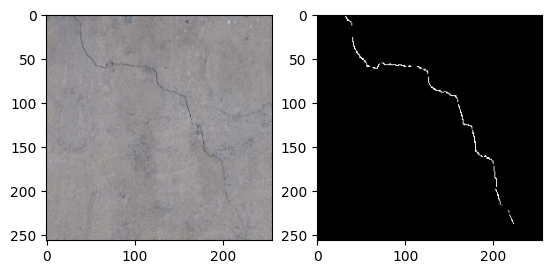

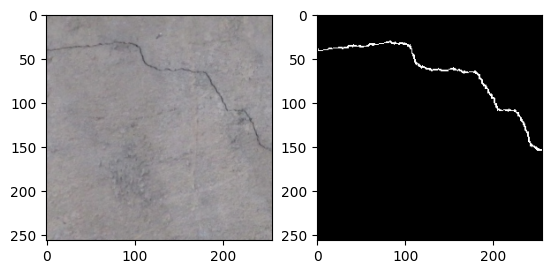

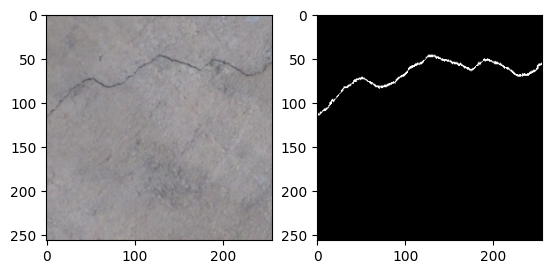

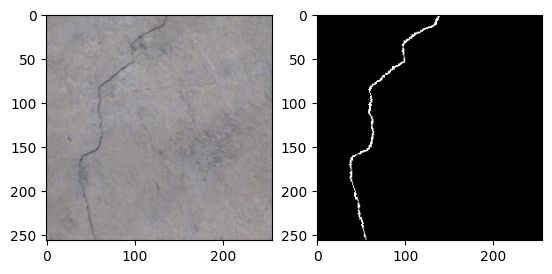

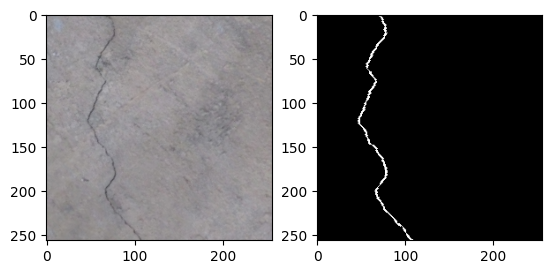

...

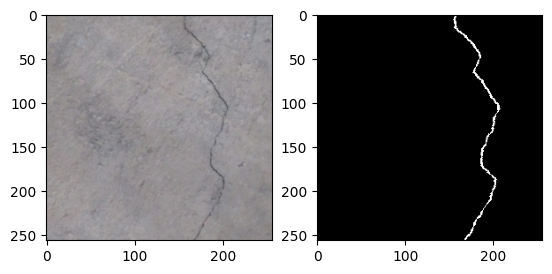

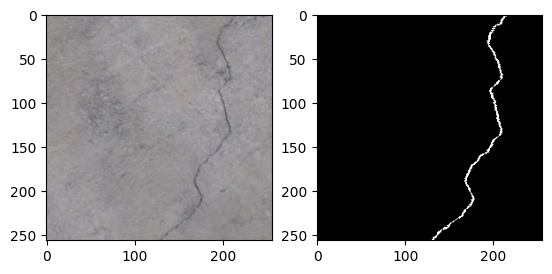

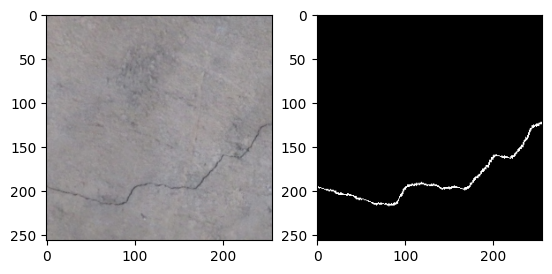

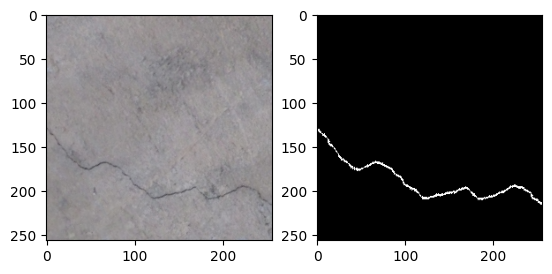

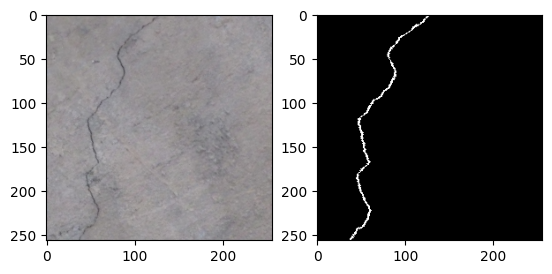

In [20]:
def drawing_tool(transforms, idx, grid):

  row = train.reset_index(drop=True).loc[idx].squeeze()
  image_path = row['ID']
  image = cv2.imread(image_path)
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.uint8)

  
  mask_path = row['label']
  mask = cv2.imread(mask_path)
  mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)
  _, mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)
  mask = mask.astype(np.uint8)
  
  transformed = transforms(image=image, mask=mask)
  
  image = transformed['image']
  mask = transformed['mask'].unsqueeze(0)
  
  # image = (image/255).float()
  # mask = mask.float()
  
  # print(np.unique(image.cpu().detach().numpy()))
  # print(np.unique(mask.cpu().detach().numpy()))

  plt.subplot(121)
  plt.imshow(image.cpu().detach().numpy().transpose(1, 2, 0))
  plt.subplot(122)
  plt.imshow(mask.cpu().detach().numpy().transpose(1, 2, 0), cmap='gray')
  plt.show()

img_num = 17
drawing_tool(train_transforms, img_num, 143)
drawing_tool(rotate_transforms, img_num, 1551)
drawing_tool(rotate_transforms1, img_num, 1551)
drawing_tool(rotate_transforms2, img_num, 1551)
drawing_tool(rotate_transforms3, img_num, 1551)
drawing_tool(rotate_transforms4, img_num, 1551)
drawing_tool(rotate_transforms5, img_num, 1551)
drawing_tool(rotate_transforms6, img_num, 1551)
drawing_tool(rotate_transforms7, img_num, 1551)
drawing_tool(rotate_transforms8, img_num, 1551)
drawing_tool(rotate_transforms9, img_num, 1551)
drawing_tool(rotate_transforms10, img_num, 1551)
drawing_tool(rotate_transforms11, img_num, 1551)
drawing_tool(rotate_transforms12, img_num, 1551)
drawing_tool(rotate_transforms13, img_num, 1551)

# drawing_tool(noise_transforms, img_num, 141)
# drawing_tool(colorjitter_transforms, img_num, 142)
# drawing_tool(superpixel_transforms, img_num, 144)
# drawing_tool(sharpening_transforms, img_num, 1)


In [21]:
# train_dataset = CrackDataset(train)
train_dataset = CrackDatasetV2(train)
rotate_dataset = CrackDatasetV2(train, transforms=rotate_transforms)
rotate_dataset1 = CrackDatasetV2(train, transforms=rotate_transforms1)
rotate_dataset2 = CrackDatasetV2(train, transforms=rotate_transforms2)
rotate_dataset3 = CrackDatasetV2(train, transforms=rotate_transforms3)
rotate_dataset4 = CrackDatasetV2(train, transforms=rotate_transforms4)
rotate_dataset5 = CrackDatasetV2(train, transforms=rotate_transforms5)
rotate_dataset6 = CrackDatasetV2(train, transforms=rotate_transforms6)
rotate_dataset7 = CrackDatasetV2(train, transforms=rotate_transforms7)
rotate_dataset8 = CrackDatasetV2(train, transforms=rotate_transforms8)
rotate_dataset9 = CrackDatasetV2(train, transforms=rotate_transforms9)
rotate_dataset10 = CrackDatasetV2(train, transforms=rotate_transforms10)
rotate_dataset11 = CrackDatasetV2(train, transforms=rotate_transforms11)
rotate_dataset12 = CrackDatasetV2(train, transforms=rotate_transforms12)
rotate_dataset13 = CrackDatasetV2(train, transforms=rotate_transforms13)

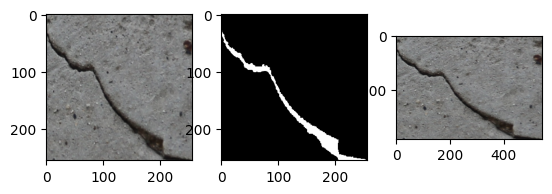

In [23]:
idx = 33

plt.subplot(131)
plt.imshow(train_dataset[idx][0].cpu().detach().numpy().transpose(1, 2, 0))

plt.subplot(132)
plt.imshow(train_dataset[idx][1].cpu().detach().numpy().transpose(1, 2, 0), cmap='gray')

plt.subplot(133)
row = train.reset_index(drop=True).loc[idx].squeeze()
image_path = row['ID']
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.uint8)
plt.imshow(image)

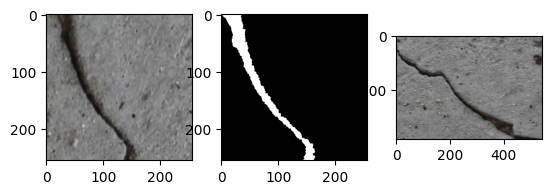

In [24]:
plt.subplot(131)
plt.imshow(rotate_dataset9[idx][0].cpu().detach().numpy().transpose(1, 2, 0))

plt.subplot(132)
plt.imshow(rotate_dataset9[idx][1].cpu().detach().numpy().transpose(1, 2, 0), cmap='gray')

plt.subplot(133)
plt.imshow(image)

In [25]:
# train_dataset = CrackDataset(train)
# colorjitter_dataset = CrackDatasetV2(train, transforms=colorjitter_transforms)
# noise_dataset = CrackDatasetV2(train, transforms=noise_transforms)
# superpixel_dataset = CrackDatasetV2(train, transforms=superpixel_transforms)
# sharpening_dataset = CrackDatasetV2(train, transforms=sharpening_transforms)

valid_dataset = CrackDataset(valid)
test_dataset = CrackDataset(test_files, train_mode=False)

total_dataset = ConcatDataset([train_dataset,rotate_dataset,rotate_dataset1,
                               rotate_dataset2,rotate_dataset3,rotate_dataset4,
                               rotate_dataset5,rotate_dataset6,rotate_dataset7,
                               rotate_dataset8,rotate_dataset9,rotate_dataset10,
                               rotate_dataset11,rotate_dataset12,rotate_dataset13])

train_dataloader = DataLoader(total_dataset, batch_size=CFG['BATCH_SIZE'], shuffle=True,
                              collate_fn = train_dataset.collate_fn, drop_last=True)
valid_dataloader = DataLoader(valid_dataset, batch_size=CFG["BATCH_SIZE"], shuffle=False,
                              collate_fn=valid_dataset.collate_fn, drop_last=True)
test_dataloader = DataLoader(test_dataset, batch_size=1, shuffle=False, drop_last=True)

In [26]:
@torch.no_grad()
def validate_test_image(model, dataset):
  idx = np.random.randint(len(dataset))
  dataset = dataset.reset_index(drop=True)
  row = dataset.loc[idx].squeeze()

  image = cv2.imread(row['ID'])
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.uint8)
  image = (image/255).astype(np.float32)
  image_tensor = train_transforms(image=image)['image'].unsqueeze(0).to(device)

  mask = cv2.imread(row['label'])
  mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)
  mask = cv2.resize(mask, (CFG['IMAGE_SIZE'], CFG['IMAGE_SIZE']))
  _, mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)

  model.eval()
  output = model(image_tensor)
  output = output[0].cpu().detach().numpy().transpose(1, 2, 0)

  plt.figure(figsize=(8, 4))
  plt.subplot(131)
  plt.title('Original image')
  plt.imshow(image)

  plt.subplot(132)
  plt.title('Original mask')
  plt.imshow(mask, cmap='gray')

  plt.subplot(133)
  plt.title('Predicted mask')
  plt.imshow(output, cmap='gray')

  plt.tight_layout()
  plt.show()
  plt.pause(0.001)


In [27]:
import math
import torch.nn.functional as F

class HrSegNetB64(nn.Module):
    """
    Args:
        num_classes (int): The unique number of target classes.

        in_channels (int, optional): The channels of input image. Default: 3.

        base (int, optional): The base channel number of the model. Default: 48.
    """
    def __init__(self,
                 in_channels=3, # input channel
                 base=64, # base channel of the model,
                 num_classes=1, # number of classes
                 pretrained=None
                 ):
        super(HrSegNetB64, self).__init__()
        self.base = base
        self.num_classed = num_classes
        self.pretrained = pretrained
        # Stage 1 and 2 constitute the stem of the model, which is mainly used to extract low-level features.
        # Meanwhile, stage1 and 2 reduce the input image to 1/2 and 1/4 of the original size respectively
        self.stage1 = nn.Sequential(
            nn.Conv2d(in_channels=in_channels, out_channels=base // 2, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(base // 2),
            nn.ReLU(),
        )
        self.stage2 = nn.Sequential(
            nn.Conv2d(in_channels=base // 2, out_channels=base, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(base),
            nn.ReLU(),
        )

        self.seg1 = SegBlock(base=base, stage_index=1)
        self.seg2 = SegBlock(base=base, stage_index=2)
        self.seg3 = SegBlock(base=base, stage_index=3)

        self.aux_head1 = SegHead(inplanes=base, interplanes=base, outplanes=num_classes, aux_head=True)
        self.aux_head2 = SegHead(inplanes=base, interplanes=base, outplanes=num_classes, aux_head=True)
        self.head = SegHead(inplanes=base, interplanes=base, outplanes=num_classes)

        self.init_weight()


    def forward(self, x):
        logit_list = []
        h, w = x.shape[2], x.shape[3]
        # aux_head only used in training
        if self.training:
            stem1_out = self.stage1(x)
            stem2_out = self.stage2(stem1_out)
            hrseg1_out = self.seg1(stem2_out)
            hrseg2_out = self.seg2(hrseg1_out)
            hrseg3_out = self.seg3(hrseg2_out)
            last_out = self.head(hrseg3_out)
            seghead1_out = self.aux_head1(hrseg1_out)
            seghead2_out = self.aux_head2(hrseg2_out)
            logit_list = [last_out, seghead1_out, seghead2_out]
            logit_list = [F.interpolate(logit, size=(h, w), mode='bilinear', align_corners=True) for logit in logit_list]
            return (logit_list[0], logit_list[1], logit_list[2])
        else:
            stem1_out = self.stage1(x)
            stem2_out = self.stage2(stem1_out)
            hrseg1_out = self.seg1(stem2_out)
            hrseg2_out = self.seg2(hrseg1_out)
            hrseg3_out = self.seg3(hrseg2_out)
            last_out = self.head(hrseg3_out)
            logit_list = [last_out]
            logit_list = [F.interpolate(logit, size=(h, w), mode='bilinear', align_corners=True) for logit in logit_list]
            return logit_list[0]

    # we does not use pretrained model on other crack dataset
    def init_weight(self):
      for m in self.modules():
        if isinstance(m, nn.Conv2d):
          torch.nn.init.kaiming_normal_(m.weight)
        elif isinstance(m, nn.BatchNorm2d):
          torch.nn.init.constant_(m.weight, 1)
          torch.nn.init.constant_(m.bias, 0)



class SegBlock(nn.Module):
    def __init__(self,
                 base=32,
                 stage_index=1):# stage_index=1,2,3.
        super(SegBlock, self).__init__()

        #  Convolutional layer for high-resolution paths with constant spatial resolution and constant channel
        self.h_conv1 = nn.Sequential(
            nn.Conv2d(in_channels=base, out_channels=base, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(base),
            nn.ReLU()
        )
        self.h_conv2 = nn.Sequential(
            nn.Conv2d(in_channels=base, out_channels=base, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(base),
            nn.ReLU()
        )
        self.h_conv3 = nn.Sequential(
            nn.Conv2d(in_channels=base, out_channels=base, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(base),
            nn.ReLU()
        )

        # sematic guidance path/low-resolution path
        if stage_index==1: #first stage, stride=2, spatial resolution/2, channel*2
            self.l_conv1 = nn.Sequential(
                nn.Conv2d(in_channels=base, out_channels=base*int(math.pow(2, stage_index)), kernel_size=3, stride=2, padding=1),
                nn.BatchNorm2d(base*int(math.pow(2, stage_index))),
                nn.ReLU()
            )
        elif stage_index==2: #second stage
            self.l_conv1 = nn.Sequential(
                nn.AvgPool2d(kernel_size=3, stride=2, padding=1),
                nn.Conv2d(in_channels=base, out_channels=base*int(math.pow(2, stage_index)), kernel_size=3, stride=2, padding=1),
                nn.BatchNorm2d(base*int(math.pow(2, stage_index))),
                nn.ReLU()
            )
        elif stage_index==3:
            self.l_conv1 = nn.Sequential(
                nn.AvgPool2d(kernel_size=3, stride=2, padding=1),
                nn.Conv2d(in_channels=base, out_channels=base*int(math.pow(2, stage_index)), kernel_size=3, stride=2, padding=1),
                nn.BatchNorm2d(base*int(math.pow(2, stage_index))),
                nn.ReLU(),
                nn.Conv2d(in_channels=base*int(math.pow(2, stage_index)), out_channels=base*int(math.pow(2, stage_index)), kernel_size=3, stride=2, padding=1),
                nn.BatchNorm2d(base*int(math.pow(2, stage_index))),
                nn.ReLU()
            )
        else:
            raise ValueError("stage_index must be 1, 2 or 3")
        self.l_conv2 = nn.Sequential(
            nn.Conv2d(in_channels=base*int(math.pow(2, stage_index)), out_channels=base*int(math.pow(2, stage_index)), kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(base*int(math.pow(2, stage_index))),
            nn.ReLU()
        )
        self.l_conv3 = nn.Sequential(
            nn.Conv2d(in_channels=base*int(math.pow(2, stage_index)), out_channels=base*int(math.pow(2, stage_index)), kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(base*int(math.pow(2, stage_index))),
            nn.ReLU()
        )

        self.l2h_conv1 = nn.Conv2d(in_channels=base*int(math.pow(2, stage_index)), out_channels=base, kernel_size=1, stride=1, padding=0)
        self.l2h_conv2 = nn.Conv2d(in_channels=base*int(math.pow(2, stage_index)), out_channels=base, kernel_size=1, stride=1, padding=0)
        self.l2h_conv3 = nn.Conv2d(in_channels=base*int(math.pow(2, stage_index)), out_channels=base, kernel_size=1, stride=1, padding=0)



    def forward(self, x):
        # out = []
        # out.append(self.h_conv3(self.h_conv2(self.h_conv1(x))))
        # out.append(self.l_conv3(self.l_conv2(self.l_conv1(x))))
        size = x.shape[2:]
        out_h1 = self.h_conv1(x) # high resolution path
        out_l1 = self.l_conv1(x) # low resolution path
        # print(out_l1.shape)
        out_l1_i = F.interpolate(out_l1, size=size, mode='bilinear', align_corners=True) # upsample
        out_hl1 = self.l2h_conv1(out_l1_i) + out_h1 # low to high

        out_h2 = self.h_conv2(out_hl1)
        out_l2 = self.l_conv2(out_l1)
        # print(out_l2.shape)
        out_l2_i = F.interpolate(out_l2, size=size, mode='bilinear', align_corners=True)
        out_hl2 = self.l2h_conv2(out_l2_i) + out_h2

        out_h3 = self.h_conv3(out_hl2)
        out_l3 = self.l_conv3(out_l2)
        # print(out_l3.shape)
        out_l3_i = F.interpolate(out_l3, size=size, mode='bilinear', align_corners=True)
        out_hl3 = self.l2h_conv3(out_l3_i) + out_h3
        return out_hl3

# seg head
class SegHead(nn.Module):
    def __init__(self, inplanes, interplanes, outplanes, aux_head=False):
        super(SegHead, self).__init__()
        self.bn1 = nn.BatchNorm2d(inplanes)
        self.relu = nn.ReLU()
        if aux_head:
            self.con_bn_relu = nn.Sequential(
                nn.Conv2d(in_channels=inplanes, out_channels=interplanes, kernel_size=3, stride=1, padding=1),
                nn.BatchNorm2d(interplanes),
                nn.ReLU(),
            )
        else:
            self.con_bn_relu = nn.Sequential(
                nn.ConvTranspose2d(in_channels=inplanes, out_channels=interplanes, kernel_size=3, stride=2, padding=1, output_padding=1),
                nn.BatchNorm2d(interplanes),
                nn.ReLU(),
            )
        self.conv = nn.Conv2d(in_channels=interplanes, out_channels=outplanes, kernel_size=1, stride=1, padding=0)


    def forward(self, x):
        x = self.bn1(x)
        x = self.relu(x)
        x = self.con_bn_relu(x)
        out = self.conv(x)
        return out


def get_model():
  model = HrSegNetB64()
  return model.to(device)


model = get_model()

In [28]:
class EarlyStopping:
  def __init__(self, patience=5, min_delta=0, path=CFG['PATH']):
    self.path = path
    self.patience = patience
    self.min_delta = min_delta
    self.counter = 0
    self.best_loss = np.inf
    self.early_stop = False

  def __call__(self, val_loss, model=None):
    if self.best_loss - val_loss > self.min_delta:
      torch.save(model.state_dict(), self.path)
      print(f'Model saved to : {self.path}')
      self.best_loss = val_loss
      self.counter = 0
    elif self.best_loss - val_loss < self.min_delta:
      self.counter += 1
      print(f"INFO: Early stopping counter {self.counter} of {self.patience}")
      if self.counter >= self.patience:
        print('INFO: Early stopping')
        self.early_stop = True


In [31]:
import torch.nn.functional as F

criterion = nn.MSELoss()
optimizer = torch.optim.SGD(model.parameters(), lr=CFG['LEARNING_RATE'], momentum=0.9, weight_decay=0.0005)
# optimizer = torch.optim.Adam(model.parameters(), lr=CFG['LEARNING_RATE'])
# scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=3, min_lr=1e-6, factor=0.1)
# scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.98)
scheduler = torch.optim.lr_scheduler.PolynomialLR(optimizer, power=0.9, total_iters=CFG['EPOCHS'])

early=EarlyStopping()

In [32]:
def train_one_batch(batch, model, criterion, optimizer):
  images, masks = batch
  optimizer.zero_grad()
  output = model(images)
  loss1 = criterion(output[0], masks)
  loss2 = criterion(output[1], masks)
  loss3 = criterion(output[2], masks)
  loss = loss1+loss2+loss3
  loss.backward()
  optimizer.step()

  return loss.item()

@torch.no_grad()
def validate_one_batch(batch, model, criterion):
  images, masks = batch
  output = model(images)
  loss = criterion(output, masks)
  return loss.item()

def validate_one_batch(batch, model):
  images, masks = batch
  output = model(images)
  loss = criterion(output, masks)
  return loss.item()

Epoch 1/45
current_lr :  0.0001


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 3453.3668.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 619.2169.
--------------------------------------------------


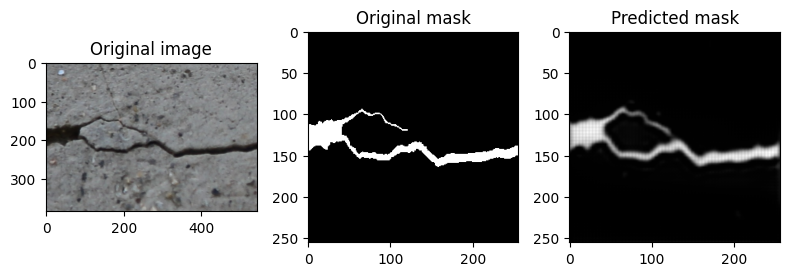

Val F1 Score: 0.8145111662531017
Val Precision: 0.8281562216167121
Val Recall: 0.8013084659701201
Epoch 2/45
current_lr :  0.0001


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 2582.4433.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 646.5186.
--------------------------------------------------


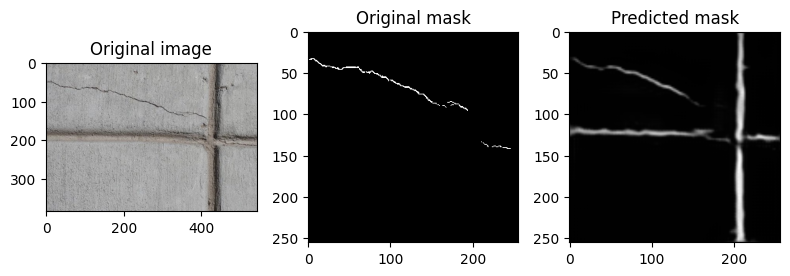

Val F1 Score: 0.8039175342578495
Val Precision: 0.7886164093248562
Val Recall: 0.8198241675234478
Epoch 3/45
current_lr :  9.799775945657815e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 2419.0548.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 672.1808.
--------------------------------------------------


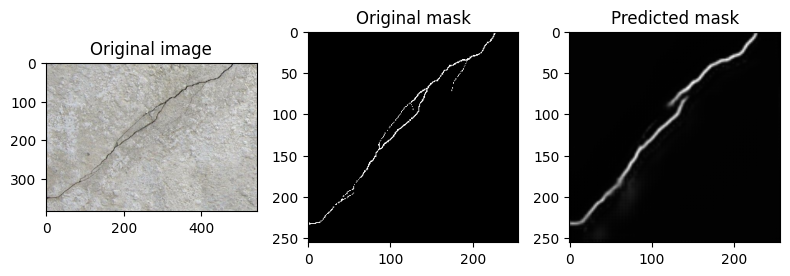

Val F1 Score: 0.8080933190372314
Val Precision: 0.8822888283378747
Val Recall: 0.7454086591750081
Epoch 4/45
current_lr :  9.599096277911104e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 2327.5842.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 556.6319.
--------------------------------------------------


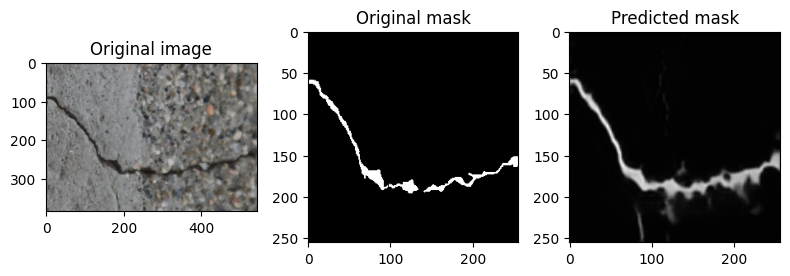

Val F1 Score: 0.8302430789366364
Val Precision: 0.8834392976082349
Val Recall: 0.783089419257881
Epoch 5/45
current_lr :  9.397949325887223e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 2230.3669.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 501.5347.
--------------------------------------------------


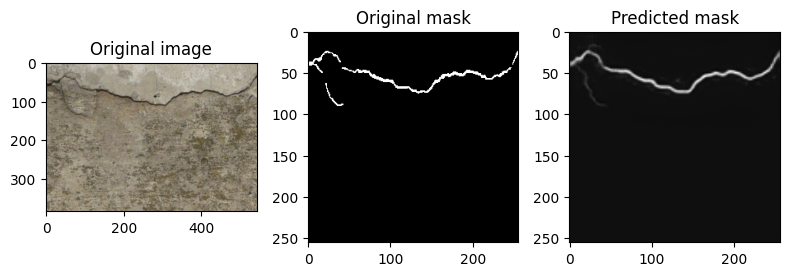

Val F1 Score: 0.8372525252525254
Val Precision: 0.8364920779089716
Val Recall: 0.8380143564856941
Epoch 6/45
current_lr :  9.196322834315274e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 2194.7252.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 554.2613.
--------------------------------------------------


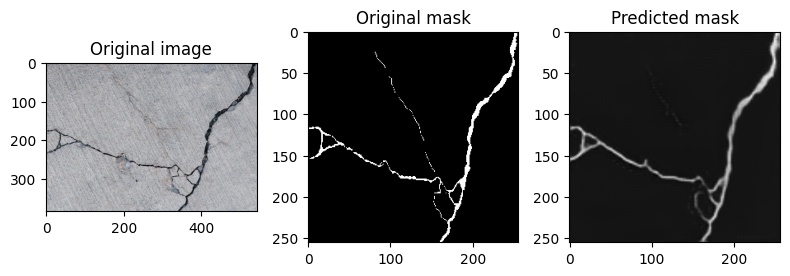

Val F1 Score: 0.8171716460686022
Val Precision: 0.8200827530527803
Val Recall: 0.8142811335123652
Epoch 7/45
current_lr :  8.994203919269412e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 2157.8387.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 528.1128.
--------------------------------------------------


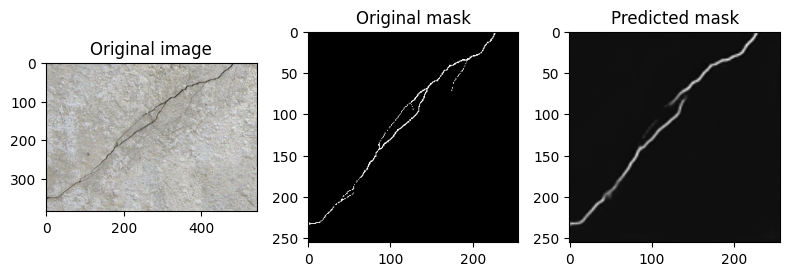

Val F1 Score: 0.8338837847034568
Val Precision: 0.8408517509334948
Val Recall: 0.8270303535624243
Epoch 8/45
current_lr :  8.791579019367991e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 2036.6398.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 501.4574.
--------------------------------------------------


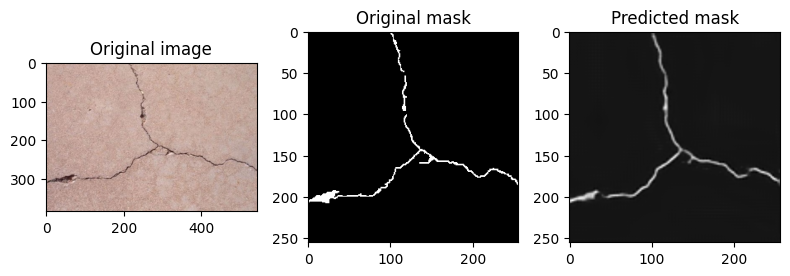

Val F1 Score: 0.831817184872633
Val Precision: 0.8037541628822282
Val Recall: 0.861910739794814
Epoch 9/45
current_lr :  8.588433841833163e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1995.4073.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 542.8889.
--------------------------------------------------


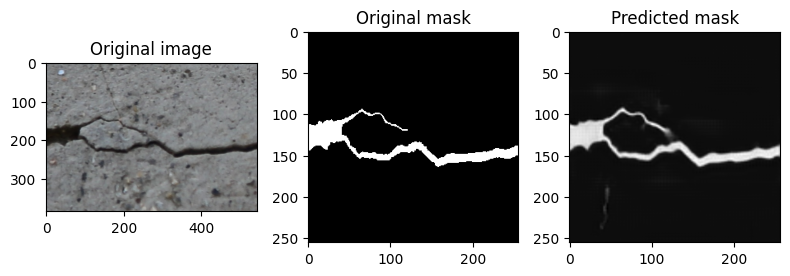

Val F1 Score: 0.8213273425853996
Val Precision: 0.7895650418811182
Val Recall: 0.8557521930304289
Epoch 10/45
current_lr :  8.38475330271982e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1963.2464.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 496.3723.
--------------------------------------------------


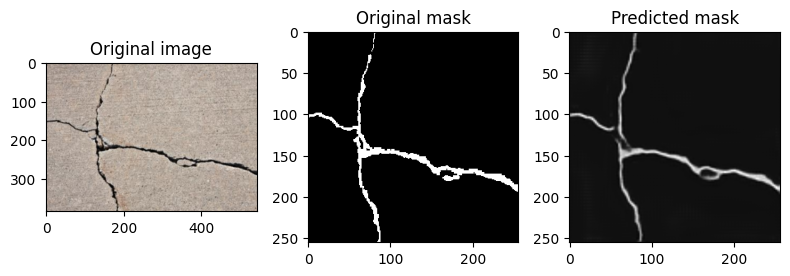

Val F1 Score: 0.837603130840639
Val Precision: 0.8186093450398627
Val Recall: 0.8574992600109941
Epoch 11/45
current_lr :  8.180521460508584e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1914.2363.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 464.7680.
--------------------------------------------------


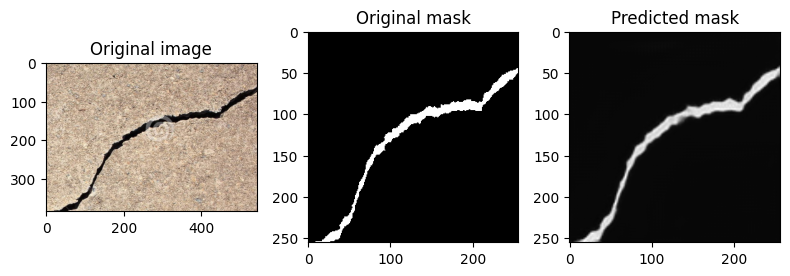

Val F1 Score: 0.849375
Val Precision: 0.8503178928247048
Val Recall: 0.8484341959520693
Epoch 12/45
current_lr :  7.975721442120746e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1906.8017.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 478.6155.
--------------------------------------------------


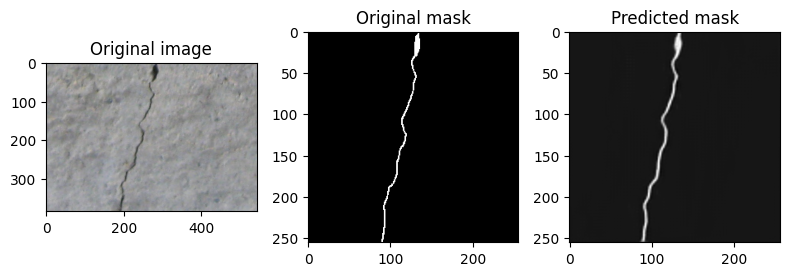

Val F1 Score: 0.8453209361088903
Val Precision: 0.8642849934403067
Val Recall: 0.8271712254674702
Epoch 13/45
current_lr :  7.770335360248572e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1847.7195.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 468.3878.
--------------------------------------------------


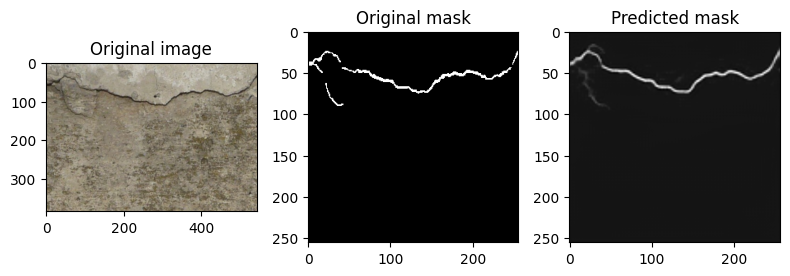

Val F1 Score: 0.8473597940528746
Val Precision: 0.8503784438389344
Val Recall: 0.8443624994989779
Epoch 14/45
current_lr :  7.564344220695323e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1810.4954.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 459.0629.
--------------------------------------------------


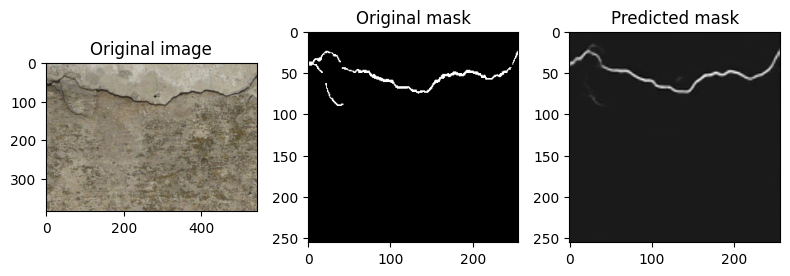

Val F1 Score: 0.8517410529920728
Val Precision: 0.853365627207589
Val Recall: 0.8501226525113604
Epoch 15/45
current_lr :  7.357727818177384e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1799.9778.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 3546.2150.
--------------------------------------------------


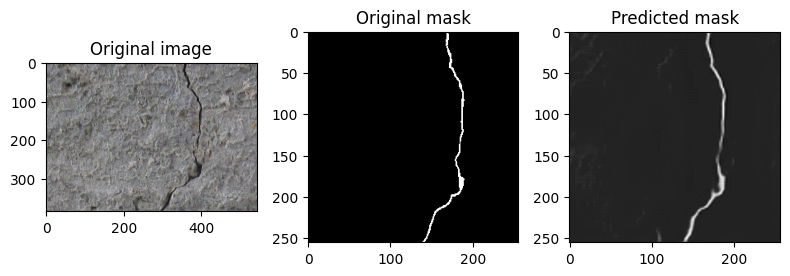

Val F1 Score: 0.36350829640593096
Val Precision: 0.8228882833787466
Val Recall: 0.23327935732309504
Epoch 16/45
current_lr :  7.150464618745225e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1815.4508.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 432.7604.
--------------------------------------------------


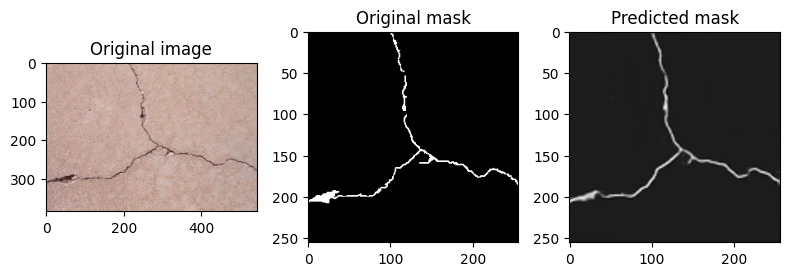

Val F1 Score: 0.8584647825330372
Val Precision: 0.8463618932283783
Val Recall: 0.8709188335964111
Epoch 17/45
current_lr :  6.942531626616071e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1762.4006.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 453.0721.
--------------------------------------------------


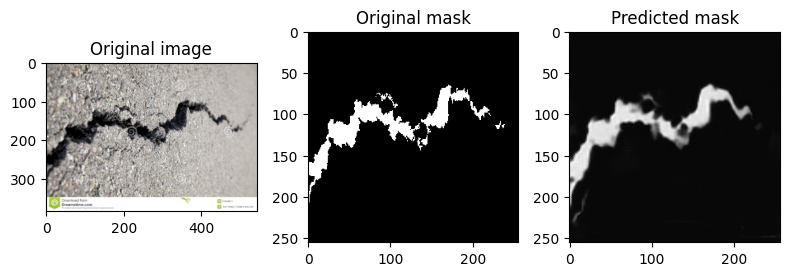

Val F1 Score: 0.8532199074541817
Val Precision: 0.8522555252800484
Val Recall: 0.854186474622216
Epoch 18/45
current_lr :  6.733904232761273e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1750.8303.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 444.1254.
--------------------------------------------------


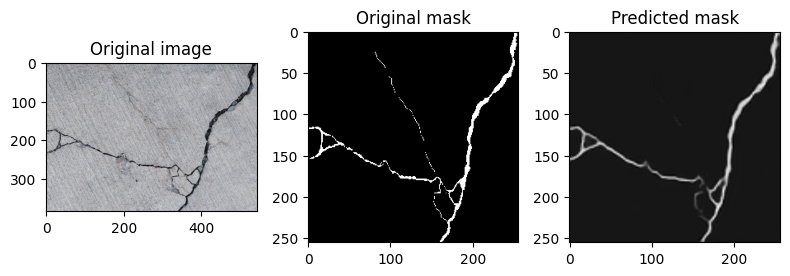

Val F1 Score: 0.8558525269942933
Val Precision: 0.8414976284186093
Val Recall: 0.8707056784244931
Epoch 19/45
current_lr :  6.524556042030722e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1730.9732.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 445.6582.
--------------------------------------------------


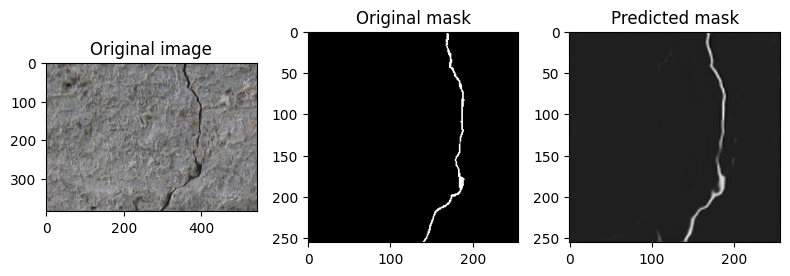

Val F1 Score: 0.8491721624250458
Val Precision: 0.8017559794126552
Val Recall: 0.9025493047350722
Epoch 20/45
current_lr :  6.314458674893553e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1729.2636.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 465.7336.
--------------------------------------------------


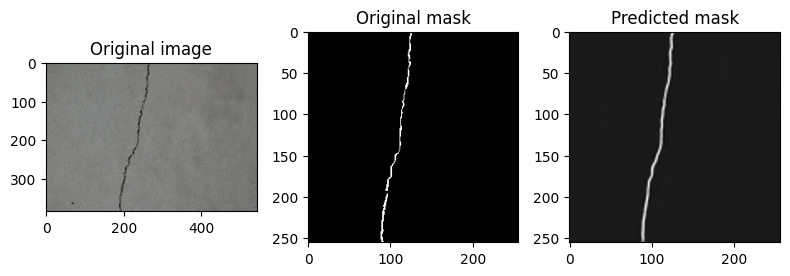

Val F1 Score: 0.8457483520550548
Val Precision: 0.8532848925219497
Val Recall: 0.8383437772665979
Epoch 21/45
current_lr :  6.103581538985657e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1700.3982.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 456.8924.
--------------------------------------------------


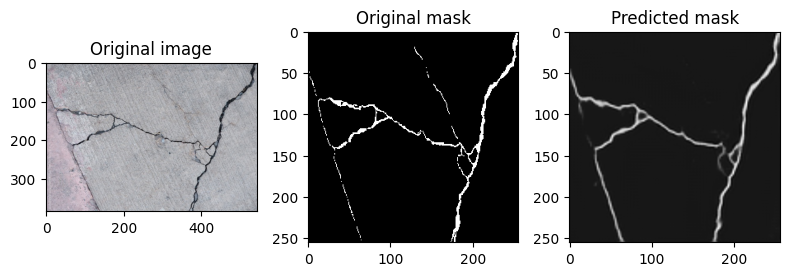

Val F1 Score: 0.8559954328011496
Val Precision: 0.8776264002422041
Val Recall: 0.835405099041288
Epoch 22/45
current_lr :  5.891891564522327e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1659.2216.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 439.0813.
--------------------------------------------------


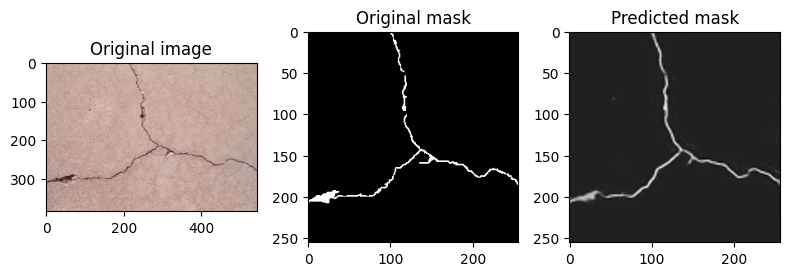

Val F1 Score: 0.8552418776997563
Val Precision: 0.843193056817035
Val Recall: 0.8676400340609358
Epoch 23/45
current_lr :  5.679352896179233e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1657.9254.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 417.9375.
--------------------------------------------------


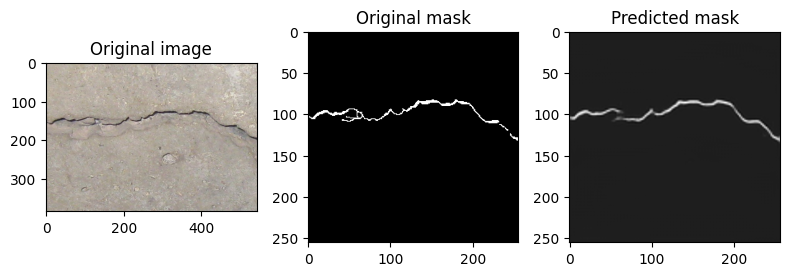

Val F1 Score: 0.8622579239055982
Val Precision: 0.8384498940357251
Val Recall: 0.887457540216625
Epoch 24/45
current_lr :  5.4659265321578225e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1646.7553.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 446.0552.
--------------------------------------------------


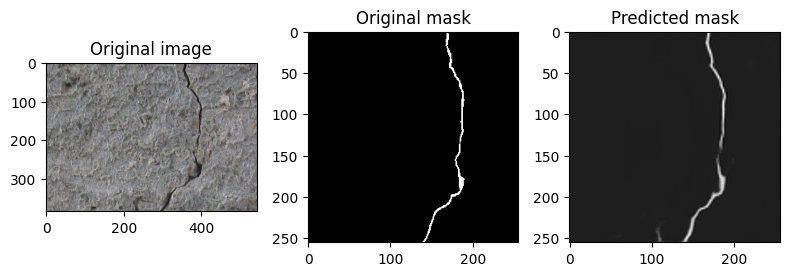

Val F1 Score: 0.8534144550508759
Val Precision: 0.8210313856090423
Val Recall: 0.8884569182046522
Epoch 25/45
current_lr :  5.251569898678778e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1649.0336.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 420.8843.
--------------------------------------------------


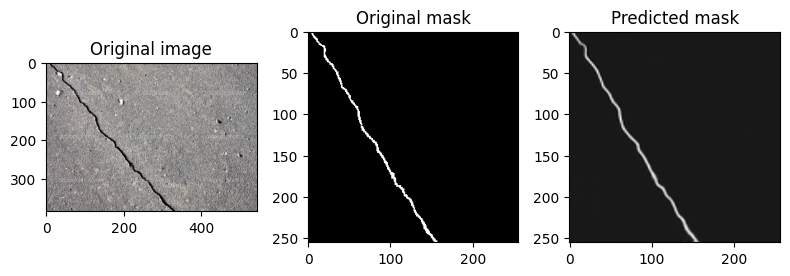

Val F1 Score: 0.8607070770127141
Val Precision: 0.8348572005247754
Val Recall: 0.8882088943288454
Epoch 26/45
current_lr :  5.0362363448733854e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1643.7504.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 421.3633.
--------------------------------------------------


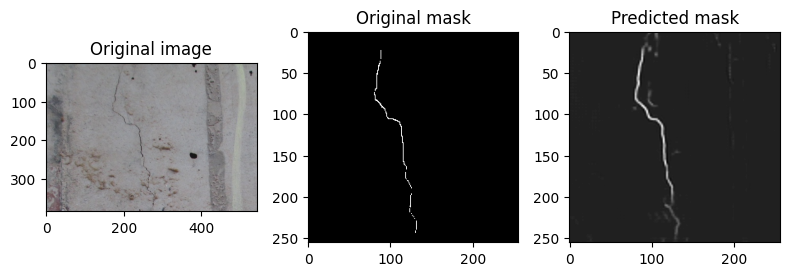

Val F1 Score: 0.8610083566033654
Val Precision: 0.8432737915026743
Val Recall: 0.8795048837992591
Epoch 27/45
current_lr :  4.819874538656438e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1606.6088.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 431.9171.
--------------------------------------------------


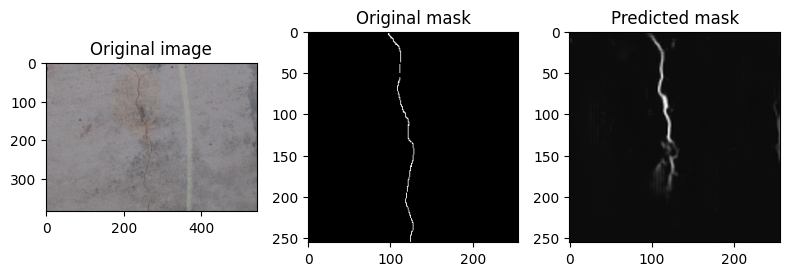

Val F1 Score: 0.8567915267372771
Val Precision: 0.8367746493087093
Val Recall: 0.877789540546263
Epoch 28/45
current_lr :  4.602427738212704e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1579.1130.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 414.3087.
--------------------------------------------------


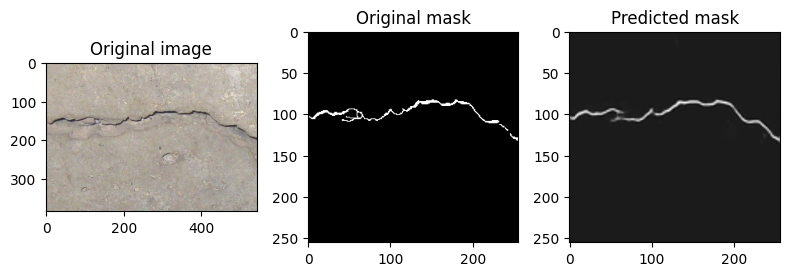

Val F1 Score: 0.8638378457120264
Val Precision: 0.8378242002220204
Val Recall: 0.8915186529498937
Epoch 29/45
current_lr :  4.38383290554087e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1578.2112.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 407.6947.
--------------------------------------------------


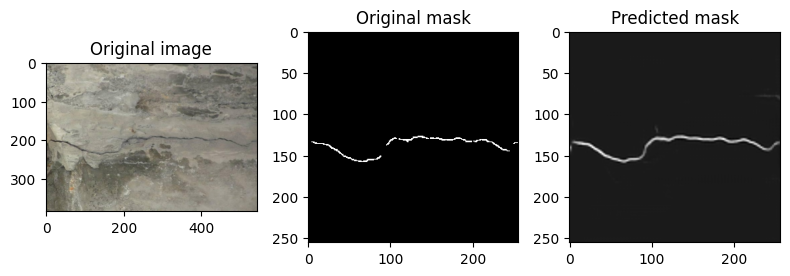

Val F1 Score: 0.8642955083724603
Val Precision: 0.8396810979917247
Val Recall: 0.8903965926845451
Epoch 30/45
current_lr :  4.164019617060904e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1572.2145.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 426.0373.
--------------------------------------------------


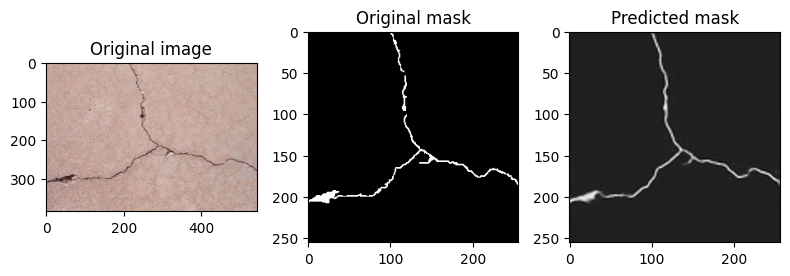

Val F1 Score: 0.858125872976748
Val Precision: 0.8432132404884448
Val Recall: 0.8735754762352843
Epoch 31/45
current_lr :  3.9429087100437904e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1554.8810.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 410.9463.
--------------------------------------------------


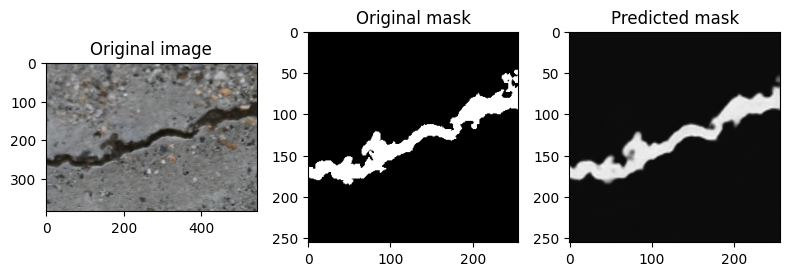

Val F1 Score: 0.8629240106418357
Val Precision: 0.8379654859218892
Val Recall: 0.8894149403371966
Epoch 32/45
current_lr :  3.720410580113015e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1546.6566.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 404.2294.
--------------------------------------------------


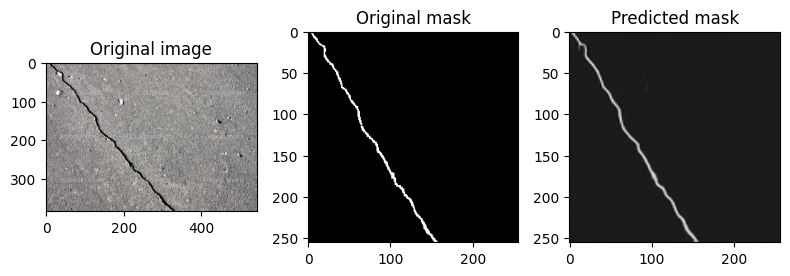

Val F1 Score: 0.8662407254740313
Val Precision: 0.8483197093551317
Val Recall: 0.8849352563427729
Epoch 33/45
current_lr :  3.49642301033968e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1529.8041.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 426.9562.
--------------------------------------------------


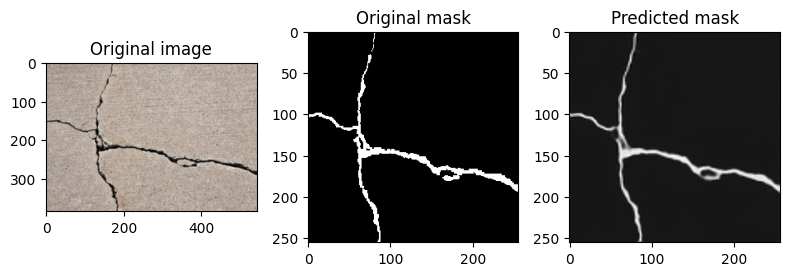

Val F1 Score: 0.853501966202572
Val Precision: 0.8104349581188818
Val Recall: 0.9014030755415872
Epoch 34/45
current_lr :  3.270828359955628e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1519.7798.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 409.3034.
--------------------------------------------------


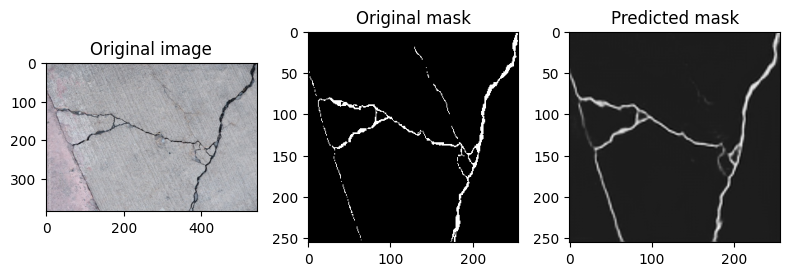

Val F1 Score: 0.8650467903464127
Val Precision: 0.8507821172671309
Val Recall: 0.8797979587151176
Epoch 35/45
current_lr :  3.0434898592517714e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1509.6639.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 406.9828.
--------------------------------------------------


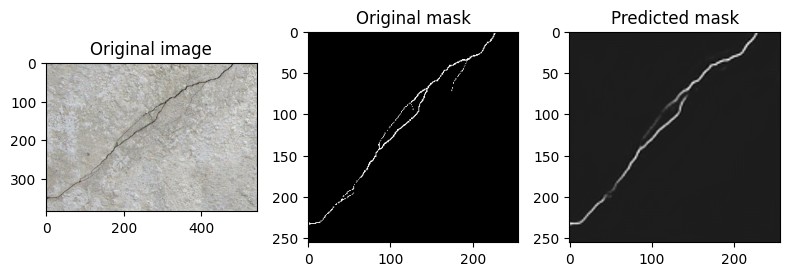

Val F1 Score: 0.8675425371527029
Val Precision: 0.8536481986073267
Val Recall: 0.88189665957713
Epoch 36/45
current_lr :  2.814246627029162e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1504.9179.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 408.9279.
--------------------------------------------------


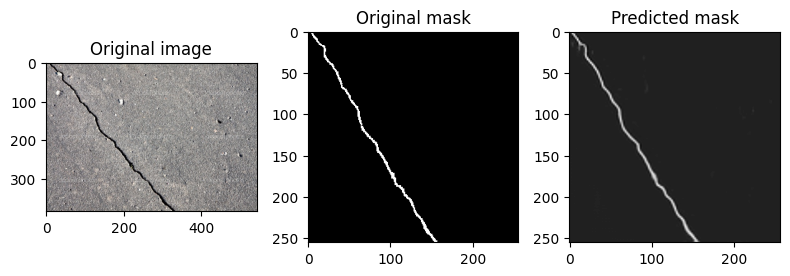

Val F1 Score: 0.8653905084884267
Val Precision: 0.8549803209203755
Val Recall: 0.8760573283974107
Epoch 37/45
current_lr :  2.5829068116431647e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1494.4302.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 396.6429.
--------------------------------------------------


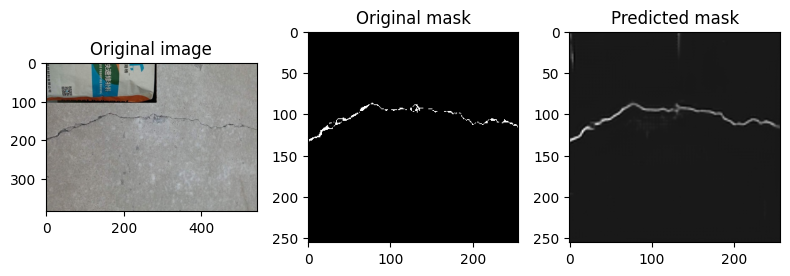

Val F1 Score: 0.8690516611620417
Val Precision: 0.8523968109799173
Val Recall: 0.8863703144020484
Epoch 38/45
current_lr :  2.3492378861760376e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1494.0070.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 407.1836.
--------------------------------------------------


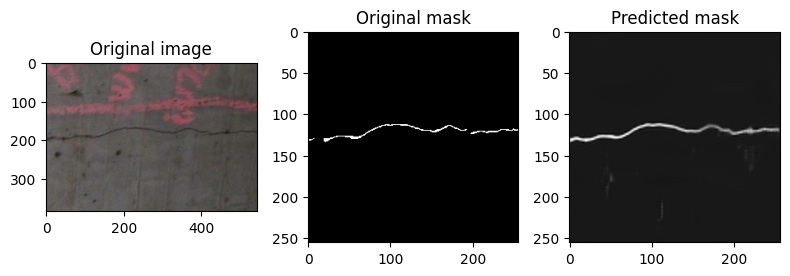

Val F1 Score: 0.8663706923952383
Val Precision: 0.8527399333938843
Val Recall: 0.8804442962530739
Epoch 39/45
current_lr :  2.1129524603140717e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1475.0139.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 401.8931.
--------------------------------------------------


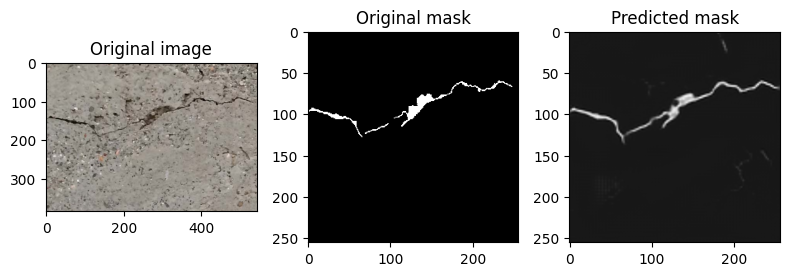

Val F1 Score: 0.868300746969264
Val Precision: 0.8587143001311939
Val Recall: 0.8781036511114322
Epoch 40/45
current_lr :  1.8736866981416642e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1473.1703.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 397.4239.
--------------------------------------------------


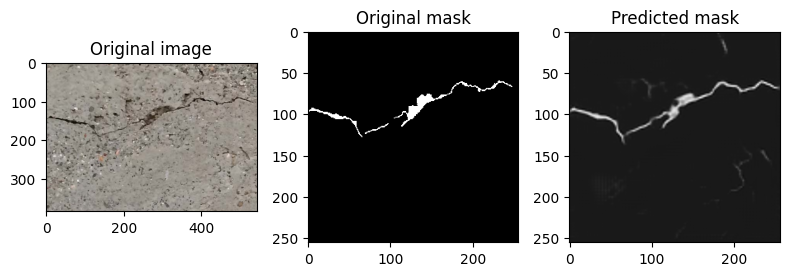

Val F1 Score: 0.8678259432890689
Val Precision: 0.8481380563124432
Val Recall: 0.8884495845402457
Epoch 41/45
current_lr :  1.6309658323221826e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1471.0387.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 400.5483.
--------------------------------------------------


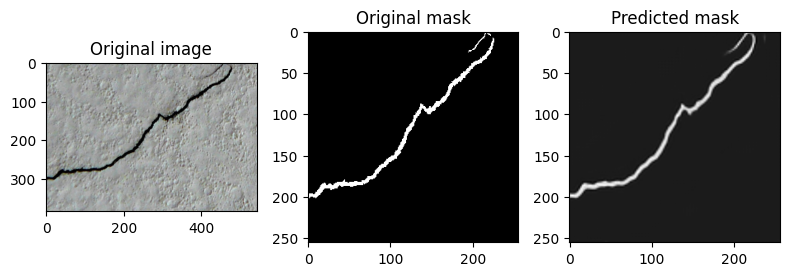

Val F1 Score: 0.8681710458526533
Val Precision: 0.850297709153295
Val Recall: 0.886811914535312
Epoch 42/45
current_lr :  1.3841454884616863e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1459.7948.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 396.1120.
--------------------------------------------------


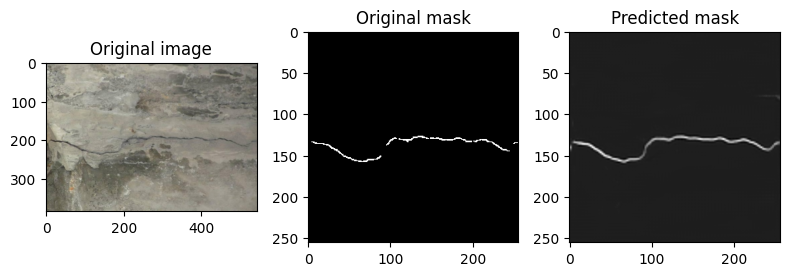

Val F1 Score: 0.8707674713066209
Val Precision: 0.860591381572308
Val Recall: 0.8811870957075247
Epoch 43/45
current_lr :  1.132303187282696e-05


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1456.0106.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 400.2995.
--------------------------------------------------


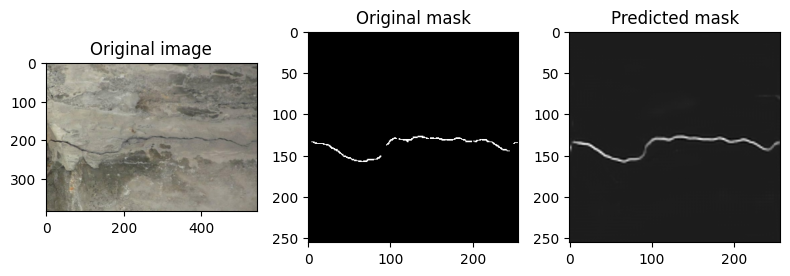

Val F1 Score: 0.868057061989319
Val Precision: 0.8480573216268039
Val Recall: 0.8890228936566374
Epoch 44/45
current_lr :  8.740129486931664e-06


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1452.1477.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 396.4356.
--------------------------------------------------


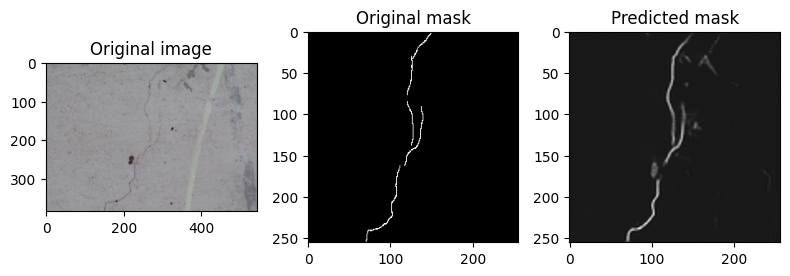

Val F1 Score: 0.8701387962782491
Val Precision: 0.8560096881622767
Val Recall: 0.8847421562082777
Epoch 45/45
current_lr :  6.067862538374272e-06


  0%|          | 0/506 [00:00<?, ?it/s]

Train loss: 1444.7960.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 395.9988.
--------------------------------------------------


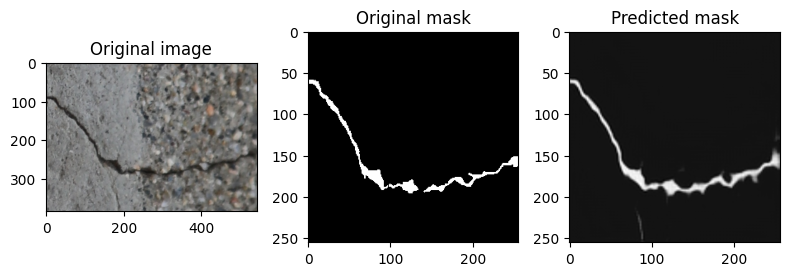

Val F1 Score: 0.8690810666172671
Val Precision: 0.8522151579372288
Val Recall: 0.8866280290621982


In [33]:
train_losses, valid_losses = [], []
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

for epoch in range(CFG['EPOCHS']):

  print(f'Epoch {epoch+1}/{CFG["EPOCHS"]}')
  print('current_lr : ', optimizer.param_groups[0]['lr'])
  epoch_train_losses, epoch_valid_losses = [], []

  model.train()
  for _, batch in enumerate(tqdm(train_dataloader, leave=False)):
    batch_train_loss = train_one_batch(batch, model, criterion, optimizer)
    epoch_train_losses.append(batch_train_loss)

  epoch_train_loss = np.array(epoch_train_losses).mean()
  train_losses.append(epoch_train_loss)

  print(f"Train loss: {epoch_train_loss:.4f}.")

  model.eval()
  y_true, y_pred = [], []

  for i, batch in enumerate(tqdm(valid_dataloader, leave=False)):
    images, masks = batch
    output = model(images)
    batch_valid_loss = criterion(output, masks)
    epoch_valid_losses.append(batch_valid_loss.item())

    y_true.append(masks.cpu().numpy())
    y_pred.append(output.cpu().detach().numpy())

  epoch_valid_loss = np.array(epoch_valid_losses).mean()
  valid_losses.append(epoch_valid_loss)
  print(f'Valid loss: {epoch_valid_loss:.4f}.')
  print('-'*50)

  y_true = np.concatenate(y_true, axis=0)
  y_pred = np.concatenate(y_pred, axis=0)
  y_pred = np.where(y_pred > 127, 255, 0)

  y_true = y_true.reshape(-1) / 255
  y_pred = y_pred.reshape(-1) / 255

  validate_test_image(model, valid)
  print('Val F1 Score:', f1_score(y_pred, y_true))
  print('Val Precision:', precision_score(y_pred, y_true))
  print('Val Recall:', recall_score(y_pred, y_true))

  if (epoch%10 == 0):
    torch.save(model.state_dict(), CFG['PATH']+f'_{epoch}')

  scheduler.step(epoch)
  # early(epoch_valid_loss, model =model)
  # if early.early_stop:
  #   print(f"Validation loss did not improve for {early.patience} epochs. Training stopped.")
  #   model.load_state_dict(torch.load(CFG['PATH']))
  #   break


In [34]:
y_pred = []
my_submission = pd.read_csv(os.path.join(base_path, 'test_files.csv'))

# test_model.eval()
model.eval()
for path, images in tqdm(zip(my_submission['ID'], test_dataloader), total=len(test_dataloader)):
  output = model(images.to(device)).cpu().detach().numpy()
  # output = test_model(images.to(device)).cpu().detach().numpy()
  output = np.where(output.astype(np.float32) > 127, 255, 0) / 255
  output = output[0][0].reshape(-1, )
  img = list(map(int, output.tolist()))
  label = "".join(map(str, img))

  chunk_size = 8
  chunks = [label[i:i+chunk_size] for i in range(0, len(label), chunk_size)]

  for i in range(len(chunks)):
    y_pred.append([path+str(i), "2" + chunks[i]])


  0%|          | 0/237 [00:00<?, ?it/s]

In [38]:
y_pred = []

epoch = 20
test_model = get_model()
test_model.load_state_dict(torch.load(CFG['PATH']+f'_{epoch}'))

my_submission = pd.read_csv(os.path.join(base_path, 'test_files.csv'))
test_model.eval()

for path, images in tqdm(zip(my_submission['ID'], test_dataloader), total=len(test_dataloader)):
  output = test_model(images.to(device)).cpu().detach().numpy()
  # output = test_model(images.to(device)).cpu().detach().numpy()
  output = np.where(output.astype(np.float32) > 127, 255, 0) / 255
  output = output[0][0].reshape(-1, )
  img = list(map(int, output.tolist()))
  label = "".join(map(str, img))

  chunk_size = 8
  chunks = [label[i:i+chunk_size] for i in range(0, len(label), chunk_size)]

  for i in range(len(chunks)):
    y_pred.append([path+str(i), "2" + chunks[i]])


  0%|          | 0/237 [00:00<?, ?it/s]

In [37]:
submission = pd.DataFrame(y_pred, columns=['ID', 'label'])
submission['label'] = submission['label'].astype(int)
submission.to_csv('./results.csv', index=False)